# Подготовка и импорты

In [1]:
import os
from dataclasses import dataclass
from ultralytics import YOLO
from ultralytics.utils.plotting import plot_results
from roboflow import Roboflow
import cv2
import random
from typing import Any, List, Dict
from pathlib import Path
import shutil

import numpy as np
import matplotlib.pyplot as plt
import yaml
import pandas as pd
import seaborn as sns
from PIL import Image
from ultralytics.utils.plotting import Annotator

In [187]:
import warnings
warnings.filterwarnings("ignore")
import logging
# Отключение логирования для cmdstanpy
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
# Полезна при разработке собственных библиотек, юпитер будет переимпортировать модули, если в них были изменения
%load_ext autoreload
%autoreload 1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Скачиваем датасеты

## RoboflowDatasetDownloader

In [25]:
@dataclass
class RoboflowDatasetDownloader:
    api_key: str
    workspace: str
    project_name: str
    version: str
    target_dir: str
    format_type: str
    overwrite: bool

    def __post_init__(self):
        self._ensure_target_dir()
        
    def _ensure_target_dir(self):
        os.makedirs(self.target_dir, exist_ok=True)

    def download(self) -> str:
        try:
            rf = Roboflow(api_key=self.api_key)
            project = rf.workspace(self.workspace).project(self.project_name)
            version = project.version(self.version)
        except Exception as ex:
            log.error("Не удалось подключиться к проетку", exc_info=ex)

        dataset = version.download(
            self.format_type,
            location=self.target_dir, 
            overwrite=self.overwrite
        )

        print(dataset.location)

        self.convert_roboflow_to_ultralytics_yaml(
            roboflow_yaml_path=os.path.join(dataset.location, "data.yaml")
        )
        
        return dataset

    @staticmethod
    def converted_labels_to_one_class(dataset_path: str) -> None:
        dataset_path = Path(dataset_path)
        label_dirs = [
            dataset_path / 'train' / 'labels',
            dataset_path / 'valid' / 'labels',
            dataset_path / 'test' / 'labels'
        ]
        for label_dir in label_dirs:
            if not label_dir.exists():
                continue
            for label_file in label_dir.glob('*.txt'):
                with open(label_file, 'r') as f:
                    lines = f.readlines()
                new_lines = []
                for line in lines:
                    parts = line.strip().split()
                    if not parts:
                        continue
                    parts[0] = '0'
                    new_lines.append(' '.join(parts) + '\n')
                with open(label_file, 'w') as f:
                    f.writelines(new_lines)

    def convert_roboflow_to_ultralytics_yaml(
        self,
        roboflow_yaml_path: str, 
        output_name: str = "dataset.yaml",
        output_dir: str = None
        ) -> str:
    
        with open(roboflow_yaml_path, 'r') as f:
            data = yaml.safe_load(f)

        src_path = Path(roboflow_yaml_path)
        base_dir = src_path.parent
        output_dir = Path(output_dir) if output_dir else src_path.parent
        output_path = output_dir / output_name

        self.converted_labels_to_one_class(base_dir)

        converted = {
            'path': str(base_dir),
            'train': 'train/images',
            'val': 'valid/images',
            'test': 'test/images',
            'names': {0: 'people'},
            'flip_idx': data['flip_idx'],
            'kpt_shape': data['kpt_shape']
        }

        if 'roboflow' in data:
            del data['roboflow']

        output_path.parent.mkdir(parents=True, exist_ok=True)
        
        with open(output_path, 'w') as f:
            yaml.dump(converted, f, sort_keys=False, default_flow_style=False)
        
        print(f"Конфигурационный файл сохранен: {output_path}")
        return str(output_path)

## analyze_dataset_structure

In [189]:
def analyze_dataset_structure(dataset, no_log: bool = False):
    config_path = os.path.join(dataset.location, "data.yaml")
    
    try:
        with open(config_path) as f:
            data_config = yaml.safe_load(f)
            if not no_log:
                print(f"Dataset Info: \n{data_config}")

        class_names = data_config.get('names', '')
        
        splits = {
            'train': data_config.get('train', ''), 
            'test': data_config.get('test', ''),
            'val': data_config.get('val', '')
        }
        
        total_images = 0
        result = {}
        
        for split_name, relative_path in splits.items():
            if not relative_path:
                continue
                
            # Полный путь к папке с изображениями
            full_images_path = os.path.join(
                dataset.location, 
                relative_path.split("./")[-1]
            )
            
            # Подсчет изображений
            if os.path.exists(full_images_path):
                images = glob(os.path.join(full_images_path, '*.jpg')) + \
                         glob(os.path.join(full_images_path, '*.png')) + \
                         glob(os.path.join(full_images_path, '*.jpeg'))
                
                count = len(images)
                result[split_name] = {
                    'path': full_images_path,
                    'images': count
                }
                total_images += count
            else:
                print(f"Directory not found: {full_images_path}")
                result[split_name] = {
                    'path': full_images_path,
                    'images': 0
                }

        # Формирование отчета
        report = ["Dataset Structure Analysis:"]
        for split, info in result.items():
            report.append(
                f"{split.capitalize()}: {info['images']} images "
                f"at {info['path']}"
            )
            
        report.append(f"\nTotal images: {total_images}")
        if not no_log:
            print("\n".join(report))
        
        return result, total_images, class_names
        
    except Exception as e:
        log.error(f"Error analyzing dataset: {str(e)}")
        raise

## exercise

In [722]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "ivan-i0fr2",
         "project_name": "exercise-3ihsw",
         "version": 1,
         "target_dir": "./dataset_1",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_1 = downloader.download()
print(f"Dataset downloaded to: {dataset_1.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_1 in yolov8:: 100%|█| 636/636 [00:00<00:00, 13667.13it/

/home/student/projects/CVTools/AnotherExample/dataset_1
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_1/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_1


In [723]:
split_info, total, class_names = analyze_dataset_structure(dataset_1)

Dataset Info: 
{'flip_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], 'kpt_shape': [17, 3], 'names': ['correct_push-up'], 'nc': 1, 'roboflow': {'license': 'CC BY 4.0', 'project': 'exercise-3ihsw', 'url': 'https://universe.roboflow.com/ivan-i0fr2/exercise-3ihsw/dataset/1', 'version': 1, 'workspace': 'ivan-i0fr2'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Dataset Structure Analysis:
Train: 218 images at /home/student/projects/CVTools/AnotherExample/dataset_1/train/images
Test: 31 images at /home/student/projects/CVTools/AnotherExample/dataset_1/test/images
Val: 63 images at /home/student/projects/CVTools/AnotherExample/dataset_1/valid/images

Total images: 312


## tarea3_1

In [724]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "tarea3",
         "project_name": "tarea3_1",
         "version": 1,
         "target_dir": "./dataset_2",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_2 = downloader.download()
print(f"Dataset downloaded to: {dataset_2.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_2 in yolov8:: 100%|█| 1816/1816 [00:00<00:00, 10073.98i


/home/student/projects/CVTools/AnotherExample/dataset_2
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_2/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_2


In [725]:
split_info, total, class_names = analyze_dataset_structure(dataset_2)

Dataset Info: 
{'flip_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], 'kpt_shape': [14, 3], 'names': ['virabhadrasana-ii', 'virabhadrasana-iii', 'vrksasana'], 'nc': 3, 'roboflow': {'license': 'CC BY 4.0', 'project': 'tarea3_1', 'url': 'https://universe.roboflow.com/tarea3/tarea3_1/dataset/1', 'version': 1, 'workspace': 'tarea3'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Dataset Structure Analysis:
Train: 789 images at /home/student/projects/CVTools/AnotherExample/dataset_2/train/images
Test: 38 images at /home/student/projects/CVTools/AnotherExample/dataset_2/test/images
Val: 75 images at /home/student/projects/CVTools/AnotherExample/dataset_2/valid/images

Total images: 902


## Aritificial Intelligence Project

In [726]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "graduationproject-ezyhw",
         "project_name": "aritificial-intelligence-project",
         "version": 3,
         "target_dir": "./dataset_3",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_3 = downloader.download()
print(f"Dataset downloaded to: {dataset_3.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_3 in yolov8:: 100%|█| 1244/1244 [00:00<00:00, 13147.96i

/home/student/projects/CVTools/AnotherExample/dataset_3
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_3/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_3


In [727]:
split_info, total, class_names = analyze_dataset_structure(dataset_3)

Dataset Info: 
{'flip_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], 'kpt_shape': [15, 3], 'names': ['KneeToElbow', 'LowPendulum', 'Standing', 'StepOutKnee'], 'nc': 4, 'roboflow': {'license': 'CC BY 4.0', 'project': 'aritificial-intelligence-project', 'url': 'https://universe.roboflow.com/graduationproject-ezyhw/aritificial-intelligence-project/dataset/3', 'version': 3, 'workspace': 'graduationproject-ezyhw'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Dataset Structure Analysis:
Train: 431 images at /home/student/projects/CVTools/AnotherExample/dataset_3/train/images
Test: 62 images at /home/student/projects/CVTools/AnotherExample/dataset_3/test/images
Val: 123 images at /home/student/projects/CVTools/AnotherExample/dataset_3/valid/images

Total images: 616


## dataset ridimensionato

In [728]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "poseestimation-wzidb",
         "project_name": "dataset-ridimensionato",
         "version": 62,
         "target_dir": "./dataset_4",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_4 = downloader.download()
print(f"Dataset downloaded to: {dataset_4.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_4 in yolov8:: 100%|█| 3832/3832 [00:00<00:00, 10776.09i


/home/student/projects/CVTools/AnotherExample/dataset_4
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_4/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_4


In [729]:
split_info, total, class_names = analyze_dataset_structure(dataset_4)

Dataset Info: 
{'flip_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], 'kpt_shape': [25, 3], 'names': ['person'], 'nc': 1, 'roboflow': {'license': 'CC BY 4.0', 'project': 'dataset-ridimensionato', 'url': 'https://universe.roboflow.com/poseestimation-wzidb/dataset-ridimensionato/dataset/62', 'version': 62, 'workspace': 'poseestimation-wzidb'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Dataset Structure Analysis:
Train: 1677 images at /home/student/projects/CVTools/AnotherExample/dataset_4/train/images
Test: 79 images at /home/student/projects/CVTools/AnotherExample/dataset_4/test/images
Val: 154 images at /home/student/projects/CVTools/AnotherExample/dataset_4/valid/images

Total images: 1910


## Workout Reps

In [730]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "workout-rep-counter",
         "project_name": "workout-reps-counter",
         "version": 6,
         "target_dir": "./dataset_5",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_5 = downloader.download()
print(f"Dataset downloaded to: {dataset_5.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_5 in yolov8:: 100%|█| 3526/3526 [00:00<00:00, 12267.12i


/home/student/projects/CVTools/AnotherExample/dataset_5
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_5/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_5


In [731]:
split_info, total, class_names = analyze_dataset_structure(dataset_5)

Dataset Info: 
{'flip_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], 'kpt_shape': [12, 3], 'names': ['JumpingJacks_End', 'JumpingJacks_Start', 'Lunges_End', 'Lunges_Start', 'Push-up_End', 'Push-up_Start', 'Sit-ups_End', 'Sit-ups_Start', 'Squats_End', 'Squats_Start'], 'nc': 10, 'roboflow': {'license': 'CC BY 4.0', 'project': 'workout-reps-counter', 'url': 'https://universe.roboflow.com/workout-rep-counter/workout-reps-counter/dataset/6', 'version': 6, 'workspace': 'workout-rep-counter'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Dataset Structure Analysis:
Train: 1353 images at /home/student/projects/CVTools/AnotherExample/dataset_5/train/images
Test: 172 images at /home/student/projects/CVTools/AnotherExample/dataset_5/test/images
Val: 232 images at /home/student/projects/CVTools/AnotherExample/dataset_5/valid/images

Total images: 1757


# Приводим в один формат

## Визуализация аннотаций

In [614]:
class ImageVisualizer:
    def __init__(self, params):
        self.params = params
        self._validate_params()
        self.imglist = params['imglist']
        self.subtitlelist = params['subtitlelist']
        self.title = params.get('title', '')
        self.figsize = params.get('figsize', (15, 5))
        self.rows = params.get('rows', 1)
        self.cols = params.get('cols', len(self.imglist))
        self.cmaps = params.get('cmaps', [])
        self.colorbars = params.get('colorbars', [])
        self.show_axis = params.get('show_axis', False)
        self.tight_layout = params.get('tight_layout', True)

    def _validate_params(self):
        if 'imglist' not in self.params or 'subtitlelist' not in self.params:
            raise ValueError("Требуются параметры 'imglist' и 'subtitlelist'")
        if len(self.params['imglist']) != len(self.params['subtitlelist']):
            raise ValueError("Количество изображений и подписей должно совпадать")

    def _convert_image(self, img):
        if isinstance(img, Image.Image):
            return np.array(img.convert('RGB'))
        elif isinstance(img, np.ndarray):
            if img.ndim == 3 and img.shape[2] == 3:
                return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            return img
        else:
            raise TypeError(f"Неподдерживаемый тип изображения: {type(img)}")

    def _auto_detect_cmap(self, image):
        if image.ndim == 2 or (image.ndim == 3 and image.shape[2] == 1):
            return 'jet'
        return None

    def visualize(self):
        plt.figure(figsize=self.figsize)
        if self.title:
            plt.suptitle(self.title, fontsize=14)
        for i, (img, subtitle) in enumerate(zip(self.imglist, self.subtitlelist)):
            converted_img = self._convert_image(img)
            plt.subplot(self.rows, self.cols, i + 1)
            cmap = self.cmaps[i] if i < len(self.cmaps) else self._auto_detect_cmap(converted_img)
            plt.imshow(converted_img, cmap=cmap)
            plt.title(subtitle)
            if not self.show_axis:
                plt.axis('off')
            if i < len(self.colorbars) and self.colorbars[i]:
                plt.colorbar()
        if self.tight_layout:
            plt.tight_layout()
        plt.show()

In [615]:
@dataclass
class Visualize:
    dataset: Any
    class_names: List[str] = None

    def __post_init__(self):
        self.split_info, self.total, self.class_names = analyze_dataset_structure(self.dataset, True)
        self.is_valid_path(self.dataset.location)
        if self.class_names is None:
            self.class_names = self._get_class_names()

    def _get_class_names(self):
        config_path = os.path.join(self.dataset.location, "data.yaml")
        with open(config_path) as f:
            data_config = yaml.safe_load(f)
        return data_config.get('names', [])

    @staticmethod
    def is_valid_path(path):
        if not os.path.exists(path):
            raise FileNotFoundError(f"Path not found: {path}")

    def ann(self, path_to_image: str, path_to_ann: str) -> np.ndarray:
        img = cv2.imread(path_to_image)
        if img is None:
            raise ValueError(f"Failed to read image: {path_to_image}")
        h, w, _ = img.shape
        if not os.path.exists(path_to_ann):
            return img

        with open(path_to_ann, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                cls_id, x_center, y_center, width, height = map(float, parts[:5])
                x_center *= w
                y_center *= h
                width *= w
                height *= h
                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)
                color = plt.cm.tab20(int(cls_id) % 20)[:3]
                color = [int(c * 255) for c in color]
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(
                    img,
                    f"{self.class_names[int(cls_id)]}",
                    (x1 + 5, y1 + 20),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2
                )
                if len(parts) > 5:
                    keypoints = list(map(float, parts[5:]))
                    num_keypoints = len(keypoints) // 3
                    points = []
                    for i_kp in range(num_keypoints):
                        kp_x = int(keypoints[3 * i_kp] * w)
                        kp_y = int(keypoints[3 * i_kp + 1] * h)
                        visible = int(keypoints[3 * i_kp + 2])
                        if visible > 0:
                            cv2.circle(img, (kp_x, kp_y), 7, color, -1)
                        points.append((kp_x, kp_y, visible))
                    if SKELETON_EDGES:
                        for idx_start, idx_end in SKELETON_EDGES:
                            if idx_start < len(points) and idx_end < len(points):
                                if points[idx_start][2] > 0 and points[idx_end][2] > 0:
                                    pt1 = (points[idx_start][0], points[idx_start][1])
                                    pt2 = (points[idx_end][0], points[idx_end][1])
                                    cv2.line(img, pt1, pt2, color, 2)
        return img

    def _get_annotations_count(self) -> Dict[str, Dict[str, int]]:
        counts = {}
        for split, info in self.split_info.items():
            ann_dir = Path(info['path']).parent / "labels"
            count = {cls_name: 0 for cls_name in self.class_names}
            for ann_file in ann_dir.glob("*.txt"):
                with open(ann_file, 'r') as f:
                    for line in f:
                        cls_id = line.strip().split()[0]
                        count[self.class_names[int(cls_id)]] += 1
            counts[split] = count
        return counts

    def _collect_bbox_statistics(self):
        self.bbox_stats = {}
        for split, info in self.split_info.items():
            ann_dir = Path(info['path']).parent / "labels"
            ann_files = list(ann_dir.glob("*.txt"))
            counts, sizes = self._count_bboxes_and_sizes(ann_files)
            self.bbox_stats[split] = {
                'counts': counts,
                'sizes': sizes
            }

    def _count_bboxes_and_sizes(self, annotation_files) -> tuple:
        bbox_counts = []
        relative_sizes = []
        for ann_file in annotation_files:
            with open(ann_file, 'r') as f:
                lines = f.readlines()
                if not lines:
                    continue
                bboxes = [list(map(float, line.split()[1:])) for line in lines]
                bbox_counts.append(len(bboxes))
                if len(bboxes) > 0:
                    sizes = [bbox[2] * bbox[3] for bbox in bboxes]
                    relative_sizes.append(sum(sizes) / len(sizes))
                else:
                    relative_sizes.append(0.0)
        return bbox_counts, relative_sizes

    def visualize_ann(self, num_samples: int = 5, seed: int = 17, max_cols: int = 4, max_name_length=18):
        random.seed(seed)
        for split, info in self.split_info.items():
            if split not in ['train', 'test', 'val']:
                continue
            image_files = list(Path(info['path']).glob("*.*"))
            if not image_files:
                continue
            selected = random.sample(image_files, min(num_samples, len(image_files)))
            num_images = len(selected)
            cols = min(num_images, max_cols)
            rows = (num_images + cols - 1) // cols
            fig_width = cols * 5
            fig_height = rows * 4 + 2
            imglist = []
            subtitlelist = []
            for img_path in selected:
                ann_path = img_path.parent.parent / "labels" / f"{img_path.stem}.txt"
                annotated_img = self.ann(str(img_path), str(ann_path))
                imglist.append(annotated_img)
                filename = img_path.name
                if len(filename) > max_name_length:
                    filename = filename[:max_name_length - 3] + "..."
                subtitlelist.append(f"{split} | {filename}")
            params = {
                "imglist": imglist,
                "subtitlelist": subtitlelist,
                "title": f"Dataset samples ({split})",
                "colorbars": [False] * num_images,
                "figsize": (fig_width, fig_height),
                "cmaps": [None] * num_images,
                "cols": cols,
                "rows": rows,
                "show_axis": False
            }
            visualizer = ImageVisualizer(params)
            visualizer.visualize()

    def visualize_hist(self):
        counts = self._get_annotations_count()
        fig, axes = plt.subplots(1, len(counts), figsize=(20, 5))
        if len(counts) == 1:
            axes = [axes]
        for ax, (split, count_dict) in zip(axes, counts.items()):
            classes = list(count_dict.keys())
            values = list(count_dict.values())
            colors = plt.cm.tab20(np.arange(len(classes)) % 20)
            bars = ax.bar(classes, values, color=colors)
            ax.set_title(f'Class Distribution - {split.capitalize()}')
            ax.set_ylabel('Count')
            ax.tick_params(axis='x', rotation=45)
            for bar in bars:
                height = bar.get_height()
                ax.annotate(f'{height}',
                            xy=(bar.get_x() + bar.get_width() / 2, height - 0.2 * height),
                            xytext=(0, 3),
                            textcoords="offset points",
                            ha='center', va='bottom',
                            rotation=90, color='white')
        plt.tight_layout()
        plt.show()

    def visualize_bbox_distribution(self):
        if not hasattr(self, 'bbox_stats'):
            self._collect_bbox_statistics()
        data = {'Split': [], 'Bounding Boxes': []}
        for split, stats in self.bbox_stats.items():
            data['Split'].extend([split] * len(stats['counts']))
            data['Bounding Boxes'].extend(stats['counts'])
        df = pd.DataFrame(data)
        plt.figure(figsize=(12, 6))
        sns.histplot(
            data=df,
            x='Bounding Boxes',
            hue='Split',
            multiple='stack',
            kde=True,
            bins=20
        )
        plt.title('Распределение количества bounding boxes на изображение')
        plt.xlabel('Количество bounding boxes')
        plt.ylabel('Частота')
        plt.show()

    def visualize_bbox_size_distribution(self):
        if not hasattr(self, 'bbox_stats'):
            self._collect_bbox_statistics()
        data = {'Split': [], 'Relative Size': []}
        for split, stats in self.bbox_stats.items():
            data['Split'].extend([split] * len(stats['sizes']))
            data['Relative Size'].extend(stats['sizes'])
        df = pd.DataFrame(data)
        plt.figure(figsize=(12, 6))
        sns.boxplot(
            x='Split',
            y='Relative Size',
            data=df,
            showfliers=False,
            palette='Set2'
        )
        plt.title('Распределение относительных размеров bounding boxes')
        plt.ylabel('Относительный размер (width × height)')
        plt.xlabel('Сплит')
        plt.show()

In [616]:
def draw_person_with_skeleton(
    image_path: str,
    labels_path: str,
    skeleton: Optional[List[List[int]]] = None,
    keypoint_colors: Optional[List[Tuple[int, int, int]]] = None,
    limb_colors: Optional[List[Tuple[int, int, int]]] = None,
    line_width: int = 2,
    font_size: int = 8,
    pil: bool = False
) -> None:
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")
    h, w = image.shape[:2]
    annotator = Annotator(
        image.copy(),
        line_width=line_width,
        font_size=font_size,
        pil=pil
    )

    with open(labels_path, "r") as f:
        lines = f.read().strip().splitlines()

    for line in lines:
        parts = line.strip().split()
        cls = int(parts[0])
        xc, yc, bw, bh = map(float, parts[1:5])
        bbox = [
            int((xc - bw / 2) * w),
            int((yc - bh / 2) * h),
            int((xc + bw / 2) * w),
            int((yc + bh / 2) * h)
        ]
        keypoints = [float(x) for x in parts[5:]]
        n_kpts = len(keypoints) // 3
        kpts = []
        vis = []
        for i in range(n_kpts):
            x = keypoints[i * 3] * w
            y = keypoints[i * 3 + 1] * h
            v = int(keypoints[i * 3 + 2])
            kpts.append((int(x), int(y)))
            vis.append(v)

        annotator.box_label(bbox, f"Class {cls}", color=(255, 0, 0))
        img_to_draw = annotator.im
        for idx, (pt, v) in enumerate(zip(kpts, vis)):
            if v > 0:
                color = (0, 255, 0) if keypoint_colors is None else keypoint_colors[idx % len(keypoint_colors)]
                cv2.circle(img_to_draw, pt, radius=4, color=color, thickness=-1, lineType=cv2.LINE_AA)
        if skeleton is not None:
            for idx, (i, j) in enumerate(skeleton):
                if vis[i] > 0 and vis[j] > 0:
                    color = (0, 0, 255) if limb_colors is None else limb_colors[idx % len(limb_colors)]
                    cv2.line(img_to_draw, kpts[i], kpts[j], color=color, thickness=line_width, lineType=cv2.LINE_AA)

    result = annotator.result()
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.show()

## Функция для конвертирования меток

In [617]:
def convert_labels_and_config_dataset(
    dataset_path: Union[str, Path],
    num_kp: int,
    kp_to_remove: dict,
    reorder_indices: list,
    kp_dim: int = 3,
    config_filename: str = "dataset.yaml",
) -> None:

    dataset_path = Path(dataset_path)
    config_path = dataset_path / config_filename

    splits = ["train", "valid", "test"]
    for split in splits:
        labels_dir = dataset_path / split / "labels"
        if not labels_dir.exists():
            continue
        
        for label_file in labels_dir.glob("*.txt"):
            with open(label_file, "r") as f:
                lines = f.read().strip().splitlines()
            
            new_lines = []
            for line in lines:
                parts = line.strip().split()
                if len(parts) < 5 + num_kp * kp_dim:
                    new_lines.append(line)
                    continue
                
                head = parts[:5]
                kpts = [float(x) for x in parts[5:5 + num_kp * kp_dim]]

                filtered_kpts = []
                for i in range(num_kp):
                    if i not in kp_to_remove:
                        filtered_kpts.extend(kpts[i * kp_dim : (i + 1) * kp_dim])

                reordered_kpts = []
                for idx in reorder_indices:
                    reordered_kpts.extend(filtered_kpts[idx * kp_dim : (idx + 1) * kp_dim])

                tail = parts[5 + num_kp * kp_dim :]
                new_line = " ".join(head + [f"{x:.6f}" for x in reordered_kpts] + tail)
                new_lines.append(new_line)
            
            with open(label_file, "w") as f:
                f.write("\n".join(new_lines) + ("\n" if new_lines else ""))

    if config_path.exists():
        with open(config_path, "r") as f:
            config = yaml.safe_load(f)

        config["kpt_shape"] = [12, kp_dim]
        config["flip_idx"] = list(range(12))

        with open(config_path, "w") as f:
            yaml.safe_dump(config, f, sort_keys=False)

## exercise

In [732]:
visualizer = Visualize(dataset_1)

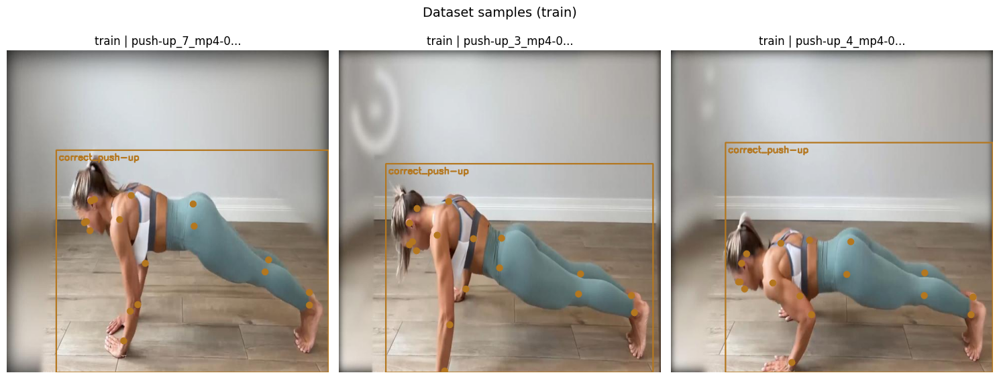

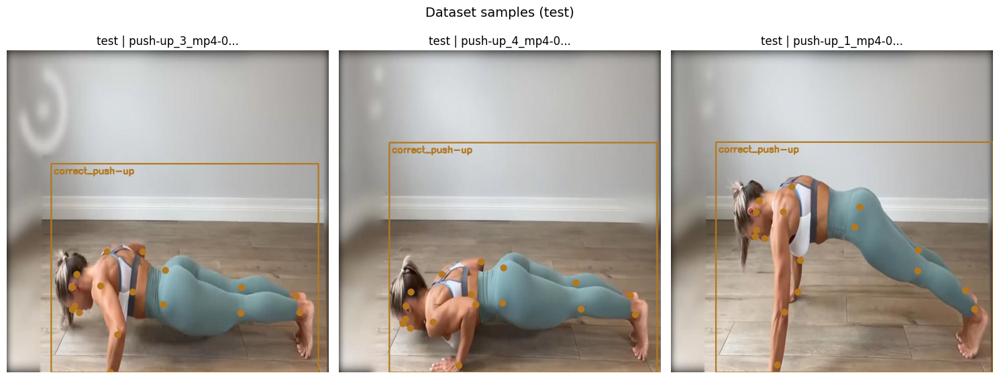

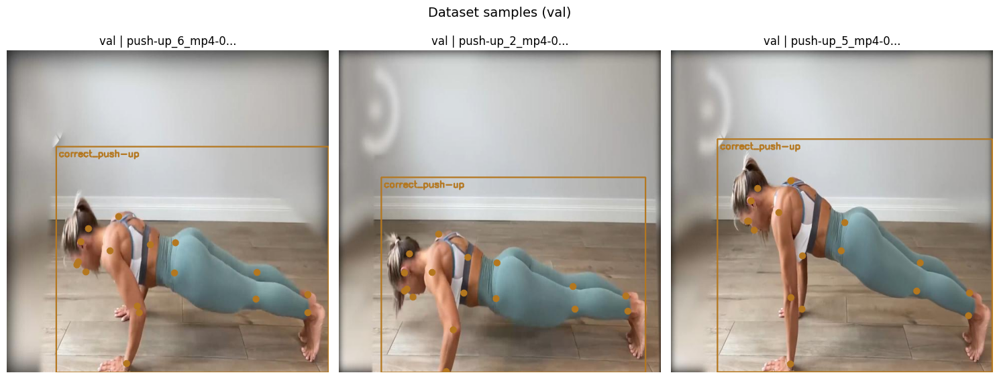

In [733]:
visualizer.visualize_ann(num_samples=3)

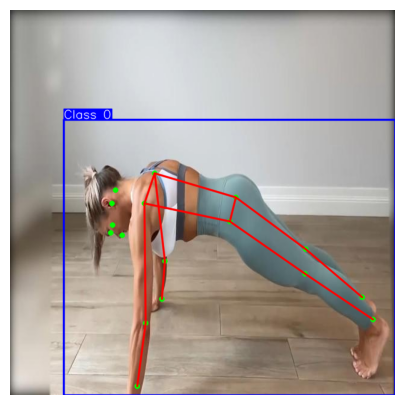

In [734]:
skeleton = [
    [5, 7], [7, 9], [6, 8], [8, 10], [5, 6], [5, 11], [6, 12],
    [11, 13], [13, 15], [12, 14], [14, 16], [11, 12]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_1/test/images/push-up_1_mp4-0000_jpg.rf.d6c0fddeda7bdf1f671441849bf3e4bf.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_1/test/labels/push-up_1_mp4-0000_jpg.rf.d6c0fddeda7bdf1f671441849bf3e4bf.txt",
    skeleton=skeleton
)

In [735]:
convert_labels_and_config_dataset(
    "/home/student/projects/CVTools/AnotherExample/dataset_1/",
    num_kp=17,
    kp_to_remove=set(range(5)),
    reorder_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
)

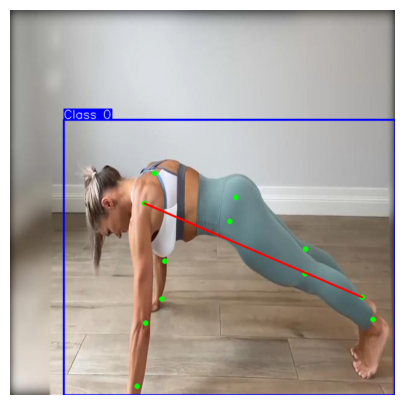

In [771]:
skeleton = [
    [0, 11], # [0, 2], [1, 3], [3, 5], [4, 2], [7, 9], [9, 11], [6, 8], [6, 7], [8, 10], [6, 0], [7, 1]
] 

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_1/test/images/push-up_1_mp4-0000_jpg.rf.d6c0fddeda7bdf1f671441849bf3e4bf.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_1/test/labels/push-up_1_mp4-0000_jpg.rf.d6c0fddeda7bdf1f671441849bf3e4bf.txt",
    skeleton=skeleton
)

## tarea3_1

In [737]:
visualizer = Visualize(dataset_2)

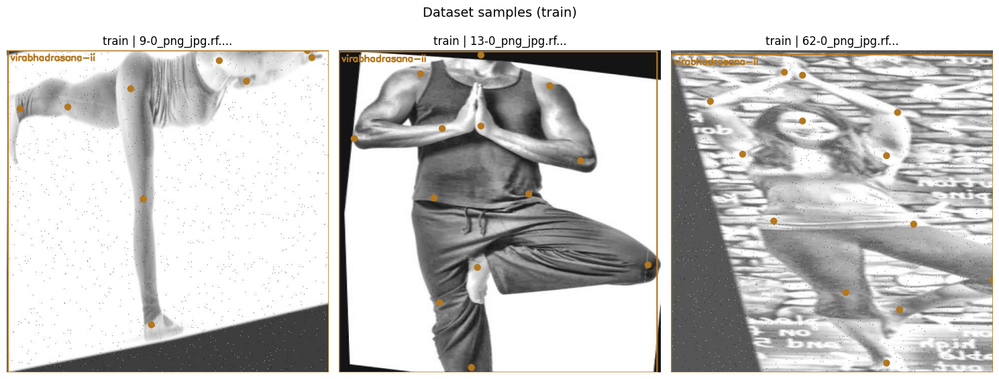

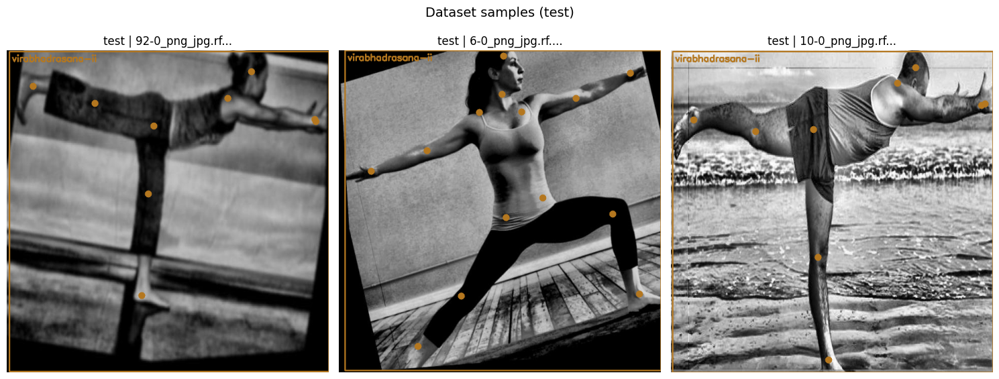

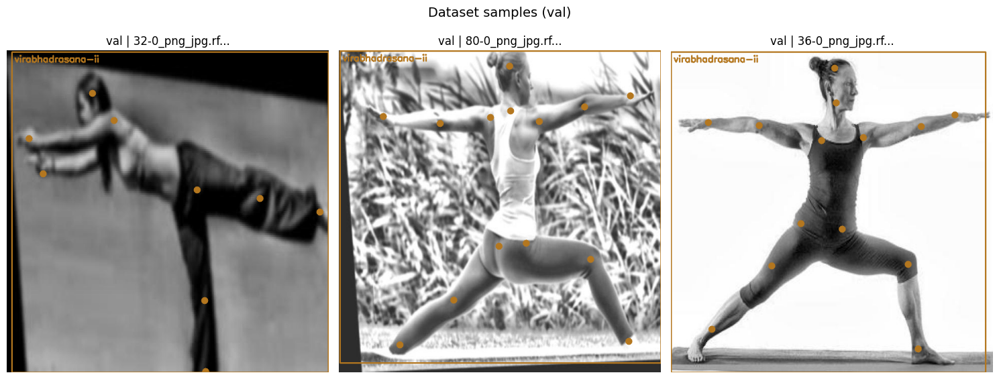

In [738]:
visualizer.visualize_ann(num_samples=3)

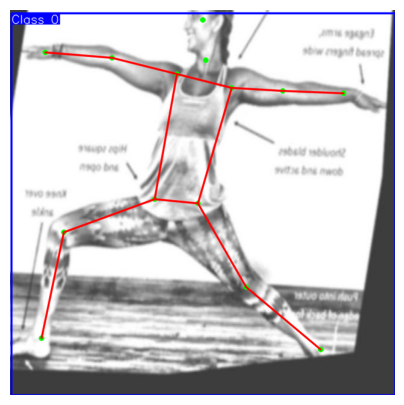

In [739]:
skeleton = [
    [1, 2], [2, 12], [3, 8], [12, 7], [5, 4], [4, 3], [11, 10], [10, 8], [7, 13], [7, 8], [12, 3], [13, 9]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_2/test/images/2-0_png_jpg.rf.b2bee4a8e0f5af2942445f286377c870.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_2/test/labels/2-0_png_jpg.rf.b2bee4a8e0f5af2942445f286377c870.txt",
    skeleton=skeleton
)

In [740]:
convert_labels_and_config_dataset(
    "/home/student/projects/CVTools/AnotherExample/dataset_2/",
    num_kp=14,
    kp_to_remove={}, # 0, 6
    reorder_indices=[12, 3, 2, 4, 1, 5, 7, 8, 13, 10, 9, 11]
)

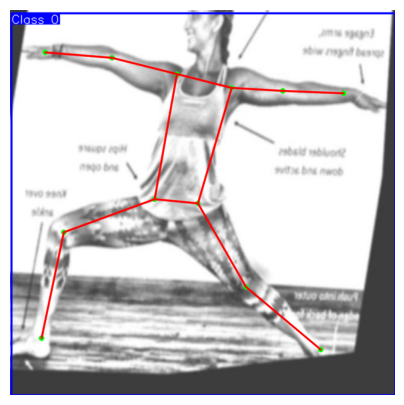

In [741]:
skeleton = [
    [0, 1], [0, 2], [1, 3], [3, 5], [4, 2], [7, 9], [9, 11], [6, 8], [6, 7], [8, 10], [6, 0], [7, 1]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_2/test/images/2-0_png_jpg.rf.b2bee4a8e0f5af2942445f286377c870.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_2/test/labels/2-0_png_jpg.rf.b2bee4a8e0f5af2942445f286377c870.txt",
    skeleton=skeleton
)

## Aritificial Intelligence Project

In [742]:
visualizer = Visualize(dataset_3)

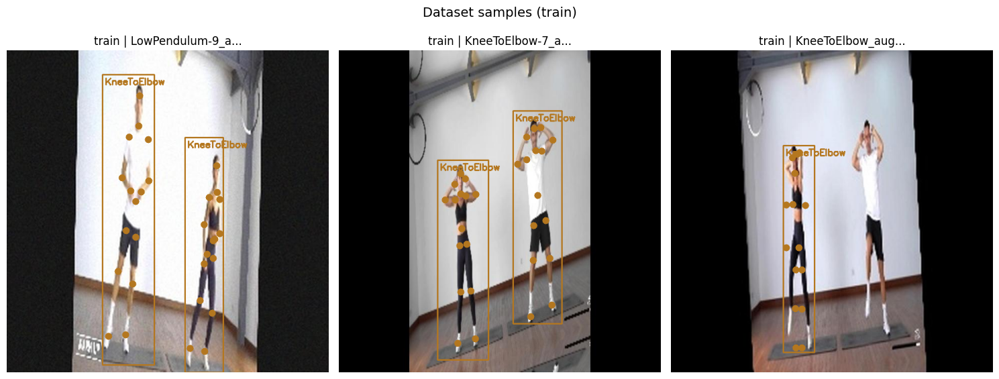

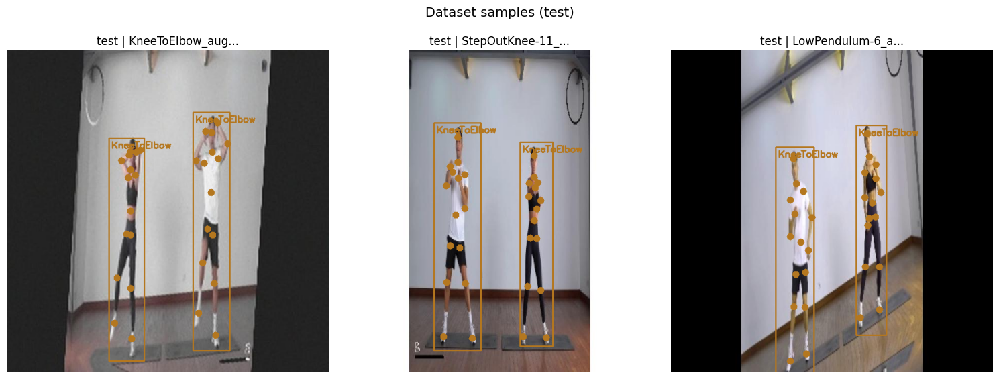

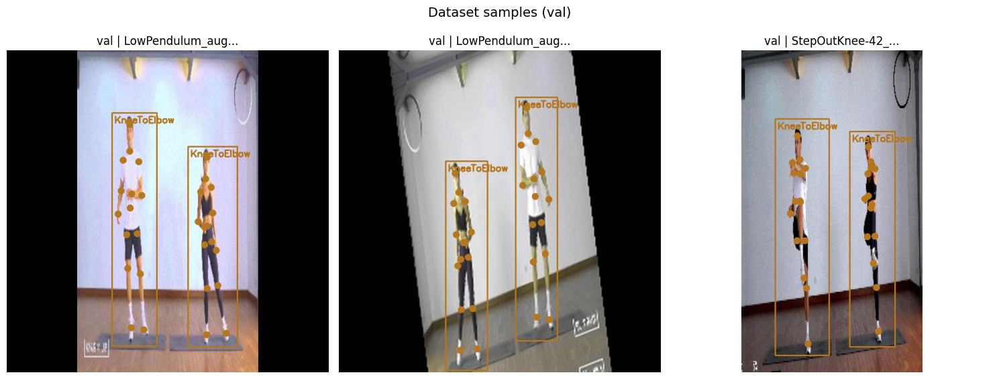

In [743]:
visualizer.visualize_ann(num_samples=3)

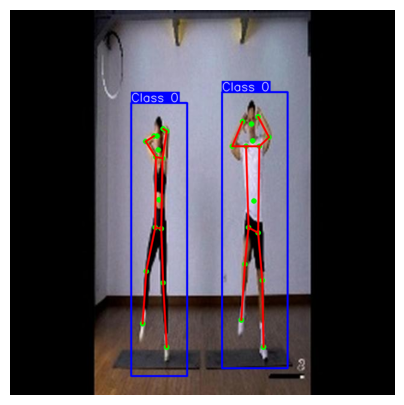

In [744]:
skeleton = [
    [2, 3], [3, 4], [4, 6], [13, 11], [14, 12], [10, 9], [10, 2], [10, 12], [9, 11], [9, 3], [2, 5], [5, 7]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_3/test/images/KneeToElbow_aug2_aug5_jpg.rf.ece3758528967c58ad74a85a48f803a9.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_3/test/labels/KneeToElbow_aug2_aug5_jpg.rf.ece3758528967c58ad74a85a48f803a9.txt",
    skeleton=skeleton
)

In [745]:
convert_labels_and_config_dataset(
    "/home/student/projects/CVTools/AnotherExample/dataset_3/",
    num_kp=15,
    kp_to_remove={0, 1, 8},
    reorder_indices=[1, 0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
)

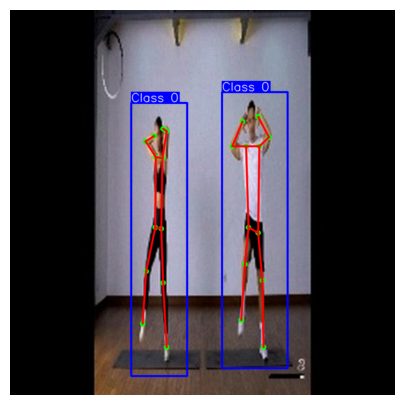

In [746]:
skeleton = [
    [0, 1], [0, 2], [1, 3], [3, 5], [4, 2], [7, 9], [9, 11], [6, 8], [6, 7], [8, 10], [6, 0], [7, 1]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_3/test/images/KneeToElbow_aug2_aug5_jpg.rf.ece3758528967c58ad74a85a48f803a9.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_3/test/labels/KneeToElbow_aug2_aug5_jpg.rf.ece3758528967c58ad74a85a48f803a9.txt",
    skeleton=skeleton
)

## dataset ridimensionato

In [747]:
visualizer = Visualize(dataset_4)

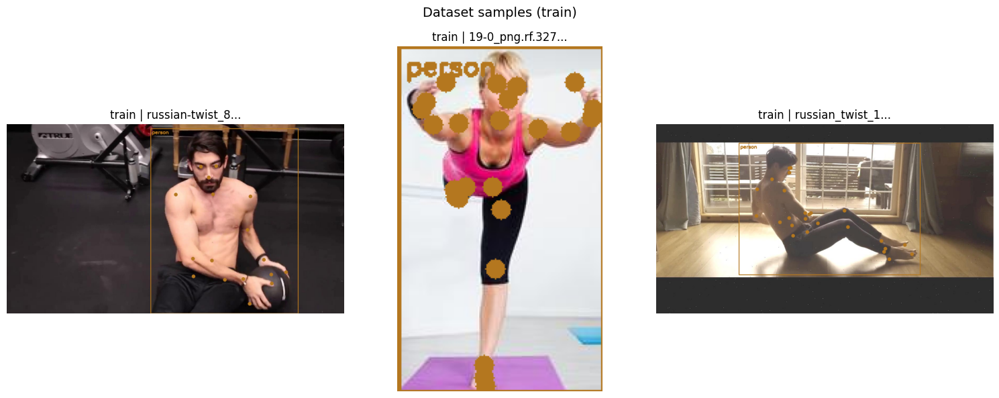

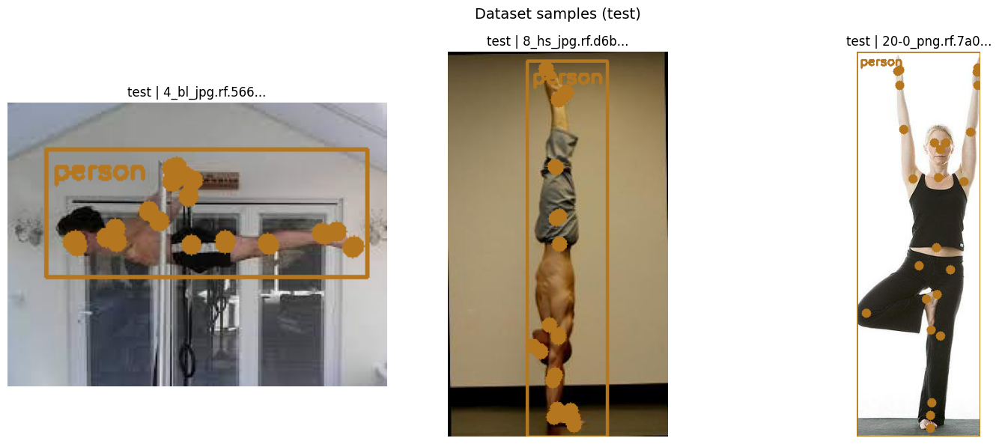

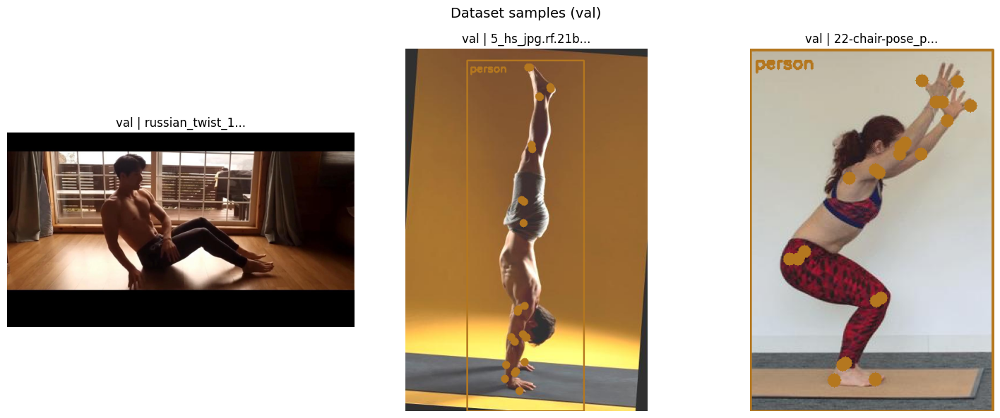

In [748]:
visualizer.visualize_ann(num_samples=3)

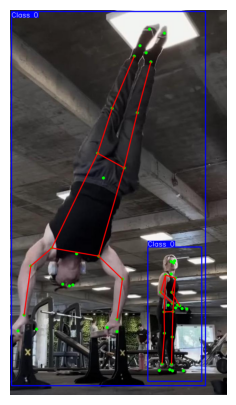

In [749]:
skeleton = [
    [4, 5], [5, 6], [9, 10], [10, 11], [15, 17], [15, 16], [17, 18], [21, 22], [16, 21], [4, 15], [9, 16], [4, 9]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_4/test/images/1-37-_jpg.rf.a41ecc25949eb8b4cadd2afdb7096abf.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_4/test/labels/1-37-_jpg.rf.a41ecc25949eb8b4cadd2afdb7096abf.txt",
    skeleton=skeleton
)

In [750]:
convert_labels_and_config_dataset(
    "/home/student/projects/CVTools/AnotherExample/dataset_4/",
    num_kp=25,
    kp_to_remove={0, 1, 2, 3, 7, 8, 12, 13, 14, 19, 20, 23, 24},
    reorder_indices=[0, 3, 1, 4, 2, 5, 6, 7, 8, 10, 9, 11]   
)

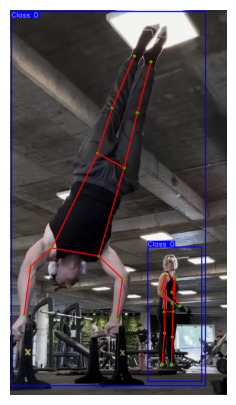

In [751]:
skeleton = [
    [0, 1], [0, 2], [1, 3], [3, 5], [4, 2], [7, 9], [9, 11], [6, 8], [6, 7], [8, 10], [6, 0], [7, 1]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_4/test/images/1-37-_jpg.rf.a41ecc25949eb8b4cadd2afdb7096abf.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_4/test/labels/1-37-_jpg.rf.a41ecc25949eb8b4cadd2afdb7096abf.txt",
    skeleton=skeleton
)

## Workout Reps Counter

In [752]:
visualizer = Visualize(dataset_5)

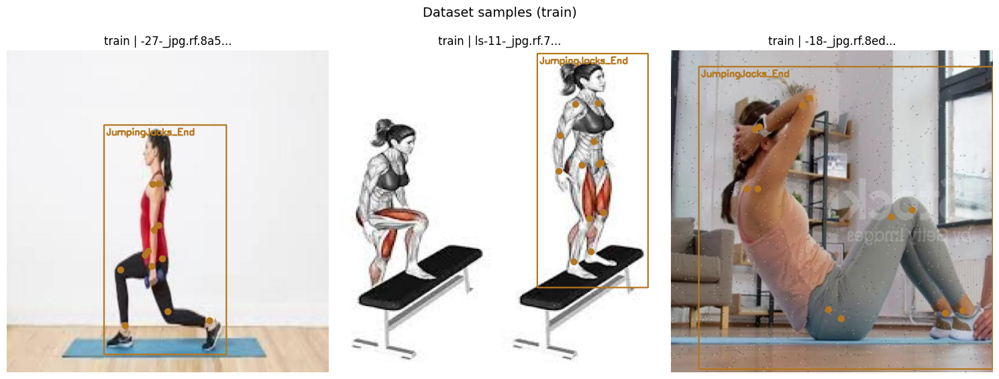

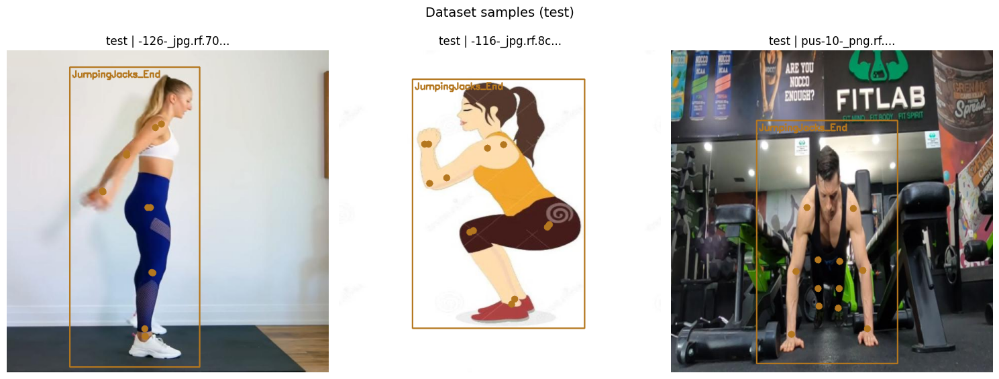

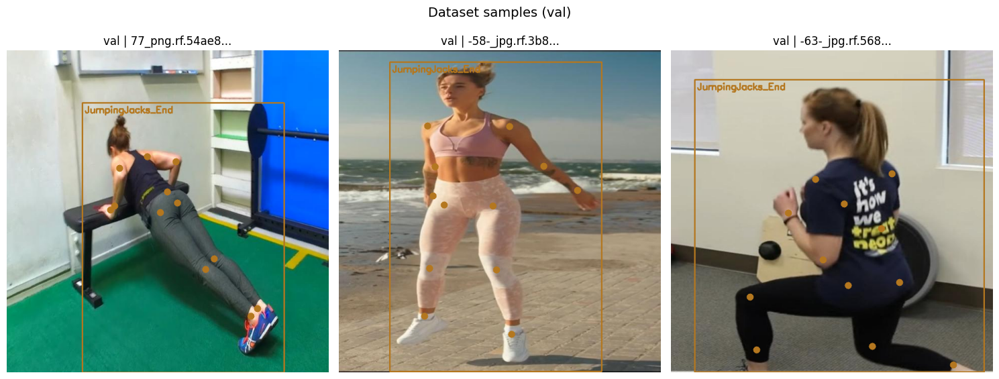

In [753]:
visualizer.visualize_ann(num_samples=3)

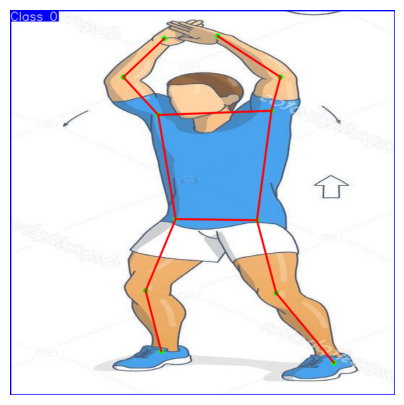

In [754]:
skeleton = [
    [0, 1], [2, 3], [3, 4], [4, 5], [2, 6], [6, 7], [0, 3], [1, 2], [8, 0], [9, 1], [9, 11], [8, 10]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_5/test/images/-10-_jpg.rf.b4a48431662ce54007d56b30c8b72ab3.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_5/test/labels/-10-_jpg.rf.b4a48431662ce54007d56b30c8b72ab3.txt",
    skeleton=skeleton
)

In [755]:
convert_labels_and_config_dataset(
    "/home/student/projects/CVTools/AnotherExample/dataset_5/",
    num_kp=12,
    kp_to_remove = {},
    reorder_indices=[1, 0, 9, 8, 11, 10, 2, 3, 6, 4, 7, 5]
)

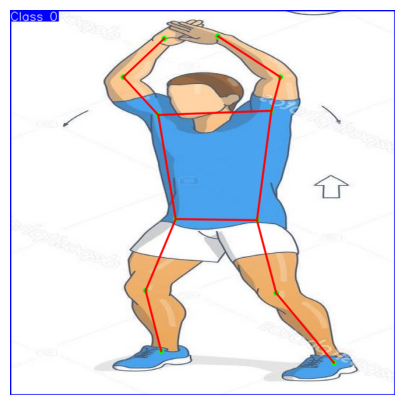

In [756]:
skeleton = [
    [0, 1], [0, 2], [1, 3], [3, 5], [4, 2], [7, 9], [9, 11], [6, 8], [6, 7], [8, 10], [6, 0], [7, 1]
]

draw_person_with_skeleton(
    "/home/student/projects/CVTools/AnotherExample/dataset_5/test/images/-10-_jpg.rf.b4a48431662ce54007d56b30c8b72ab3.jpg",
    "/home/student/projects/CVTools/AnotherExample/dataset_5/test/labels/-10-_jpg.rf.b4a48431662ce54007d56b30c8b72ab3.txt",
    skeleton=skeleton
)

# Организуем общий датасет

In [700]:
def merge_cocon_pose_datasets_with_summary(
    dataset_paths: List[Union[str, Path]],
    output_path: Union[str, Path],
    config_filename: str = "dataset.yaml",
    delete_source: bool = False
) -> dict:

    # Преобразование путей к объектам Path
    dataset_paths = [Path(path) for path in dataset_paths]
    output_path = Path(output_path)
    
    # Проверка наличия исходных датасетов
    for path in dataset_paths:
        if not path.exists():
            raise FileNotFoundError(f"Датасет не найден: {path}")
    
    # Статистика объединения
    stats = {
        "train": {"images": 0, "labels": 0},
        "valid": {"images": 0, "labels": 0},
        "test": {"images": 0, "labels": 0}
    }
    
    # Создание структуры директорий для выходного датасета
    splits = ["train", "valid", "test"]
    for split in splits:
        (output_path / split / "images").mkdir(parents=True, exist_ok=True)
        (output_path / split / "labels").mkdir(parents=True, exist_ok=True)
    
    # Копирование конфигурационного файла из первого датасета
    if dataset_paths:
        config_src = dataset_paths[0] / config_filename
        config_dst = output_path / config_filename
        if config_src.exists():
            shutil.copy2(config_src, config_dst)
    
    # Объединение файлов из соответствующих директорий
    for split in splits:
        for dataset_path in dataset_paths:
            images_dir = dataset_path / split / "images"
            labels_dir = dataset_path / split / "labels"
            
            # Пропускаем, если директория не существует
            if not images_dir.exists() or not labels_dir.exists():
                continue
            
            # Копирование изображений
            for img_file in images_dir.glob("*"):
                if img_file.is_file():
                    shutil.copy2(img_file, output_path / split / "images" / img_file.name)
                    stats[split]["images"] += 1
            
            # Копирование меток
            for label_file in labels_dir.glob("*"):
                if label_file.is_file():
                    shutil.copy2(label_file, output_path / split / "labels" / label_file.name)
                    stats[split]["labels"] += 1
    
    # Удаление исходных датасетов, если указано
    if delete_source:
        for path in dataset_paths:
            shutil.rmtree(path)
    
    return stats

In [702]:
merge_cocon_pose_datasets_with_summary(
    [
        "/home/student/projects/CVTools/AnotherExample/dataset_1",
        "/home/student/projects/CVTools/AnotherExample/dataset_2",
        "/home/student/projects/CVTools/AnotherExample/dataset_3",
        "/home/student/projects/CVTools/AnotherExample/dataset_4",
        "/home/student/projects/CVTools/AnotherExample/dataset_5"
    ],
    "/home/student/projects/CVTools/AnotherExample/dataset",
    delete_source=True
)


{
    'train': {'images': 4468, 'labels': 4468},
    'valid': {'images': 647, 'labels': 647},
    'test': {'images': 382, 'labels': 382}
}

## В конфигурационном файле нужно поменять путь к датасету

# Обучение модели

In [16]:
augm = {
    # "degrees":  3,
    # "mosaic":  0,
    # "mixup":  0,
    # "scale": 0,
    # "flipud": 0
}

In [17]:
model = YOLO('yolo11n-pose.pt')

In [18]:
# Тренировка
result_train = model.train(data="/home/student/projects/CVTools/AnotherExample/dataset/dataset.yaml",
                           batch=16,
                           imgsz=640,
                           save=True,
                           device=0,
                           project="fitness",
                           name="yolo11n_pose_v3",
                           box=3.5,
                           pose=16.0,
                           exist_ok=True,
                           optimizer="SGD",
                           lr0=0.003,
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           cache=True,
                           rect=True,
                           time=6,
                           amp=True,
                           single_cls=True,
                           classes=[0],
                           multi_scale=False,
                           dropout=0.05,
                           **augm)

New https://pypi.org/project/ultralytics/8.3.146 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.145 🚀 Python-3.12.10 torch-2.7.0+cu126 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=3.5, cache=True, cfg=None, classes=[0], close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/student/projects/CVTools/AnotherExample/dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.05, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=False, nam

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 4468 im

train: /home/student/projects/CVTools/AnotherExample/dataset/train/images/-6-_jpg.rf.374f4b187d0fe26bab14a7efad436183.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.005531 1.005531]
train: /home/student/projects/CVTools/AnotherExample/dataset/train/images/-7-_jpg.rf.c23085ab07ffdb25e7bc201c5adcc326.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.006637 1.006637]
train: /home/student/projects/CVTools/AnotherExample/dataset/train/images/13-0_png.rf.1579a862f0f1a037fb8fd663955a4bf0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.271924]
train: /home/student/projects/CVTools/AnotherExample/dataset/train/images/13-0_png.rf.a6a9a383bc4fb807593268fa4bb98a3e.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.271924]
train: /home/student/projects/CVTools/AnotherExample/dataset/train/images/13-0_png.rf.ff2062b22339f0131d111a20fc0dd80c.jpg: ignoring corrupt image/l


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 647 image

val: /home/student/projects/CVTools/AnotherExample/dataset/valid/images/89-0_png_jpg.rf.3f5cc20d79bba3355b9c22944c80d973.jpg: ignoring corrupt image/label: negative label values [-0.00163]
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.



val: Caching images (0.7GB RAM): 100%|██████████| 646/646 [00:00<00:00, 3821.99it/s]


Plotting labels to fitness/yolo11n_pose_v3/labels.jpg... 
optimizer: SGD(lr=0.003, momentum=0.937) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to fitness/yolo11n_pose_v3
Starting training for 6 hours...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100      34.5G     0.6178      10.71     0.5667     0.8464      1.844         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.833      0.859      0.853      0.366     0.0432     0.0216    0.00388   0.000507



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/318      34.5G     0.4962      8.961     0.4463     0.6167      1.591         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.815      0.901      0.863      0.424     0.0585     0.0445    0.00977    0.00172

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/323      34.5G     0.5114      8.232     0.3959     0.6852      1.626         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.814      0.893      0.868      0.387      0.158       0.18     0.0463    0.00928



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/326      34.5G     0.5281      7.958     0.3746     0.7466      1.669         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.827      0.879       0.91       0.47       0.36      0.389      0.185     0.0299

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/328      34.5G     0.5119      7.566     0.3629     0.6909      1.638         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.841      0.921      0.928      0.542       0.48      0.504        0.3     0.0652



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/329      34.5G      0.488      7.264     0.3421     0.6699      1.582         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.895      0.928      0.953      0.554      0.495      0.489      0.299     0.0632

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/329      34.5G     0.4633      7.029     0.3341     0.6338      1.543         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.825      0.869      0.868      0.508      0.452      0.462      0.259     0.0566



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/330      34.6G     0.4472      6.906     0.3297     0.6263      1.508         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.868      0.918      0.911      0.525      0.491      0.516      0.298     0.0649

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/330      34.6G     0.4373      6.744     0.3274     0.5963      1.488         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.896      0.939      0.937      0.584      0.475      0.494      0.275     0.0498

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/330      34.6G     0.4288      6.639     0.3151     0.5727      1.475         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.865      0.915      0.921      0.585      0.515      0.547      0.357      0.089



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/330      34.6G     0.4231      6.632     0.3157     0.5684       1.47         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832        0.9      0.912      0.926      0.592      0.463      0.533      0.323     0.0732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/330      34.6G     0.4095      6.429     0.3054     0.5553       1.44         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.851      0.876      0.884      0.588      0.475      0.482      0.289      0.067



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/330      34.6G      0.408       6.32     0.3032     0.5437      1.436         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.889       0.92      0.937      0.598      0.598      0.617      0.443      0.109

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/330      34.6G     0.3956      6.075     0.2975     0.5248      1.405         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.838      0.868      0.886      0.548      0.557        0.6      0.408     0.0921



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/330      34.6G     0.3904      6.081     0.2903     0.5261      1.403         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.843        0.9       0.91      0.576      0.582      0.585      0.424      0.116



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/331      34.6G     0.3897      5.921     0.2872     0.5099      1.391         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.873      0.894       0.92      0.587      0.552      0.546      0.375      0.104

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/331      34.6G     0.3788      5.862      0.279      0.508      1.372         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.891      0.927      0.929      0.552       0.65      0.637      0.485      0.134



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/331      34.6G     0.3705      5.783     0.2792     0.4852      1.356         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.902       0.95      0.953      0.639      0.667       0.68      0.525      0.167



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/331      34.6G     0.3695      5.776     0.2785     0.4947       1.36         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.898      0.908      0.922      0.606       0.65      0.641      0.488      0.139



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/331      34.6G     0.3713      5.685     0.2691     0.4852      1.358         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.921       0.93      0.938       0.57      0.671      0.683      0.533      0.163

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/331      34.6G     0.3668      5.581     0.2634     0.4742      1.353         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.926      0.964      0.956      0.636      0.694      0.704      0.551      0.161



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/331      34.6G     0.3559      5.431     0.2676     0.4578      1.326         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.898      0.922      0.927      0.592      0.673      0.697      0.542      0.176



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/331      34.6G     0.3612       5.45     0.2647     0.4611      1.335         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.924      0.945      0.952       0.65      0.729      0.731      0.613      0.203

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/331      34.6G     0.3489      5.283     0.2575     0.4518      1.312         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.921      0.957      0.956      0.647      0.704      0.728      0.577      0.203

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/331      34.6G     0.3425      5.282     0.2547     0.4444        1.3         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.918      0.951      0.956      0.642      0.717      0.741      0.593        0.2



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/331      34.6G     0.3433      5.279     0.2531     0.4419      1.302         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.911      0.958      0.952      0.665      0.697      0.725      0.586      0.185



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/331      34.6G     0.3426      5.099     0.2462      0.435      1.303         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.927      0.948      0.957      0.645      0.701      0.718      0.571      0.179



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/331      34.6G     0.3351      5.044     0.2513     0.4268      1.287         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.942      0.963       0.97      0.666      0.731      0.748      0.618      0.209



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/331      34.6G     0.3336      4.995     0.2536     0.4279       1.29         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.924      0.933      0.956       0.68       0.73      0.736      0.608      0.223



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/331      34.6G     0.3297      4.962     0.2461     0.4218      1.284         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.926      0.964      0.967      0.687       0.77      0.768      0.663      0.227



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/331      34.6G     0.3296      4.884     0.2411     0.4158      1.272         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.937      0.954      0.967       0.68      0.781      0.799      0.687       0.25



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/331      34.6G     0.3262      4.787     0.2366     0.4142      1.276         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.932       0.95      0.963      0.674      0.764      0.772      0.667      0.231



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/331      34.6G      0.321      4.774      0.244     0.4055      1.271         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.934      0.952      0.961      0.666      0.755      0.762      0.652      0.228



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/331      34.6G     0.3245      4.784     0.2401     0.4104      1.264         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.902      0.959      0.962      0.688      0.782      0.767      0.681      0.259



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/331      34.6G      0.322      4.705     0.2356     0.4065      1.265         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.923      0.953      0.965      0.675      0.761      0.792      0.677      0.254



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/331      34.6G     0.3164      4.693     0.2374     0.4006      1.259         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.932      0.975      0.969      0.692       0.77      0.791      0.688       0.26



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/330      34.6G     0.3143      4.608     0.2339     0.3965      1.255         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.925      0.954      0.969      0.718      0.789        0.8      0.705      0.266



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/330      34.6G     0.3155      4.542     0.2314     0.3975      1.248         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.927       0.97      0.969      0.681      0.779       0.81      0.686      0.256



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/330      34.6G       0.31      4.582     0.2334     0.3928      1.244         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.941      0.941       0.97      0.704      0.795      0.791       0.69      0.263



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/329      34.6G     0.3089      4.496     0.2302     0.3873      1.242         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.928       0.97       0.97      0.707      0.799      0.824      0.724      0.267



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/329      34.6G     0.3108      4.498     0.2328     0.3853      1.245         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.943      0.959      0.969      0.698      0.783      0.785      0.683      0.269



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/329      34.6G     0.3061       4.42     0.2179      0.378      1.236         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.943      0.968      0.972        0.7      0.828      0.848      0.758      0.299



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/329      34.6G     0.3009      4.377     0.2273     0.3729      1.223         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.911      0.963      0.962       0.69        0.8      0.794      0.719      0.282



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/329      34.6G     0.3031      4.289     0.2152     0.3745      1.226         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.928      0.972      0.965      0.697      0.807      0.845       0.75      0.294



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/328      34.6G     0.2984      4.277     0.2222     0.3747      1.213         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.933      0.944      0.964      0.674      0.806      0.802      0.717       0.28

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/328      34.6G     0.2957      4.234     0.2153     0.3697      1.213         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832       0.94      0.956      0.973      0.714      0.808      0.822      0.744      0.296



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/328      34.6G     0.2954      4.256       0.22     0.3652      1.211         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.935      0.971      0.971      0.686      0.822      0.858      0.767      0.296



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/328      34.6G     0.2917      4.229     0.2189     0.3639      1.211         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.944      0.974      0.975      0.716      0.822      0.831      0.754      0.292



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/328      34.6G      0.295      4.144     0.2157     0.3628      1.211         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.869      0.942      0.962      0.713      0.767      0.832      0.741      0.295



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/327      34.6G     0.2972      4.176     0.2137     0.3724      1.216         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.916      0.956      0.959      0.674      0.807      0.836      0.747      0.302



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/327      34.6G     0.2937        4.1     0.2159     0.3706      1.211         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.938       0.96       0.97      0.693      0.814      0.827      0.742      0.302



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/327      34.6G     0.2933      4.081     0.2121     0.3654       1.21         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.914      0.944      0.956      0.663      0.811      0.822      0.756      0.314



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/327      34.6G     0.2884      4.053     0.2094     0.3559      1.201         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.945      0.963      0.972      0.716      0.834      0.835      0.756       0.32



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/327      34.6G     0.2839      3.971     0.2059     0.3566      1.187         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.939       0.96       0.97      0.724      0.812      0.811      0.733        0.3



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/327      34.6G     0.2865      3.983     0.2077      0.354        1.2         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.947      0.954      0.972      0.684      0.842       0.84      0.773      0.315



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/327      34.6G     0.2845      3.948     0.2053     0.3515      1.195         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832       0.96      0.959      0.981      0.733      0.831      0.831       0.75      0.314



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/326      34.6G     0.2828       3.95      0.208     0.3487      1.192         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.924      0.971      0.977      0.721      0.822      0.857       0.78      0.322



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/326      34.6G     0.2836      3.924     0.2055     0.3525      1.198         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.887      0.937      0.962      0.697      0.779      0.837      0.753        0.3



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/326      34.6G     0.2802      3.892     0.2111     0.3552      1.193         15        224
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        646        832      0.912      0.963      0.974      0.712      0.798      0.843      0.751      0.324



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/325      34.6G     0.2788      3.635     0.1946     0.3452      1.152         16        640


KeyboardInterrupt: 

In [19]:
model = YOLO(r'./fitness/yolo11n_pose_v3/weights/last.pt')

In [20]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=640,
                        save=False,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.145 🚀 Python-3.12.10 torch-2.7.0+cu126 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLO11n-pose summary (fused): 109 layers, 2,766,703 parameters, 0 gradients, 7.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1449.6±246.2 MB/s, size: 28.6 KB)


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 647 image

val: /home/student/projects/CVTools/AnotherExample/dataset/valid/images/89-0_png_jpg.rf.3f5cc20d79bba3355b9c22944c80d973.jpg: ignoring corrupt image/label: negative label values [-0.00163]



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P


                   all        646        832      0.964      0.936      0.955      0.723      0.845      0.821      0.773      0.365
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to /home/student/projects/CVTools/runs/pose/val


In [21]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=640,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           project="fitness",
                           show_labels=True,
                           augment=False)


image 1/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-1-_jpg.rf.a65431a9e0e2861908c210e0d85d4db6.jpg: 640x640 1 item, 7.2ms
image 2/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-10-_jpg.rf.b4a48431662ce54007d56b30c8b72ab3.jpg: 640x640 1 item, 8.1ms
image 3/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-100-_jpg.rf.816de6cebd1de865f614c76243c3e96a.jpg: 640x640 1 item, 7.5ms
image 4/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-101-_jpg.rf.41f06f884a3c22f760b6fa4df515e5b6.jpg: 640x640 1 item, 7.7ms
image 5/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-101-_jpg.rf.bc5b3afdde6ea75faa28515cdb98bc73.jpg: 640x640 1 item, 7.8ms
image 6/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-106-_jpg.rf.2d0568e4e8ab23519df08434e3aae235.jpg: 640x640 1 item, 9.0ms
image 7/382 /home/student/projects/CVTools/AnotherExample/dataset/test/images/-107-_jpg.rf.517dd

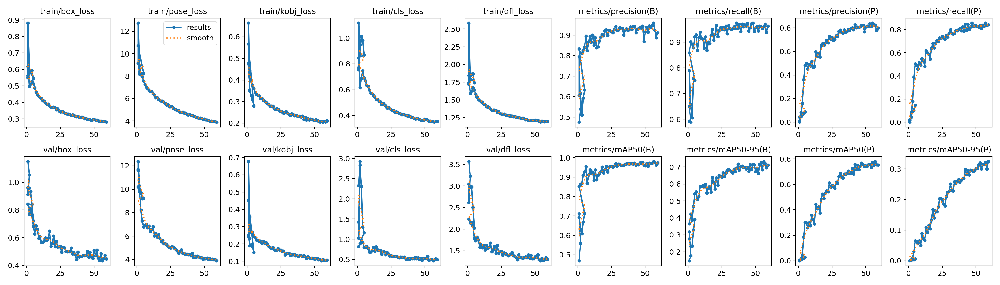

In [22]:
from IPython import display as ipd
location = "./fitness/yolo11n_pose_v3"
plot_results(os.path.join(location, "results.png"), pose=True)
ipd.display(ipd.Image(os.path.join(location, "results.png")))

In [23]:
results = model.track(source='https://www.youtube.com/watch?v=tXpz-tzxB-w',
                      stream=True,
                      show=False,
                      save=True,
                      conf=0.3,
                      iou=0.01,
                      imgsz=640,
                      stream_buffer=True,
                      augment=False,
                      classes=[0],
                      verbose=True,
                      batch=64,
                      project="fitness")
for n,r in enumerate(results):
    detected = next(results)
    if n == 500:
        break


1/1: https://www.youtube.com/watch?v=tXpz-tzxB-w... Success ✅ (12271 frames of shape 1920x1080 at 25.00 FPS)

0: 384x640 (no detections), 11.4ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.8ms
0: 384x640 (no detections), 9.6ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 9.6ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.9ms
0: 384x640 (no detections), 7.7ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 8.0ms
0: 384x640 (no detections), 12.2ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.8ms
0: 384x640 (no detections), 8.5ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.9ms
0: 384x640 (no detections), 7.7ms
0: 384x640 (no detections), 7.8ms
0: 384x640 (no detections), 7.7ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.8ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.9ms
0: 384x640 (no detections), 9.2ms
0: 

In [ ]:
# model_pre = YOLO('yolo11n-pose.pt')

In [ ]:
# results = model_pre.track(source='https://www.youtube.com/watch?v=tXpz-tzxB-w',
#                       stream=True,
#                       show=False,
#                       save=True,
#                       conf=0.3,
#                       iou=0.01,
#                       imgsz=640,
#                       stream_buffer=True,
#                       augment=False,
#                       classes=[0],
#                       verbose=True,
#                       batch=64,
#                       project="fitness",
#                       name="yolo11n_pose_v2")
# for n,r in enumerate(results):
#     detected = next(results)
#     if n == 1000:
#         break

# Проверка на случайном наборе данных

In [26]:
# Качаем данные
downloader = RoboflowDatasetDownloader(
    **{
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "mielpops",
         "project_name": "keypoint-detection-6omnr",
         "version": 9,
         "target_dir": "./dataset_random",
         "format_type": "yolov8",
         "overwrite": True
    }
)               

dataset_random = downloader.download()
print(f"Dataset downloaded to: {dataset_random.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset_random in yolov8:: 100%|█| 2845/2845 [00:00<00:00, 1054


/home/student/projects/CVTools/AnotherExample/dataset_random
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset_random/dataset.yaml
Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset_random


In [38]:
model = YOLO('yolo11n-pose.pt')

In [28]:
# Тренировка
result_train = model.train(data="/home/student/projects/CVTools/AnotherExample/dataset_random/data.yaml",
                           batch=16,
                           imgsz=640,
                           save=True,
                           device=0,
                           project="fitness",
                           name="yolo8n_pose_random",
                           box=3.5,
                           pose=16.0,
                           exist_ok=True,
                           optimizer="SGD",
                           lr0=0.003,
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           cache=True,
                           rect=True,
                           time=6,
                           amp=True,
                           multi_scale=False,
                           dropout=0.05,
                           **augm)

New https://pypi.org/project/ultralytics/8.3.146 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.145 🚀 Python-3.12.10 torch-2.7.0+cu126 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=3.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/student/projects/CVTools/AnotherExample/dataset_random/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.05, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=False

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset_random/train/labels... 1135 i

train: New cache created: /home/student/projects/CVTools/AnotherExample/dataset_random/train/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (1.3GB RAM): 100%|██████████| 1135/1135 [00:00<00:00, 3502.54it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ 'rect=True' is incompatible with DataLoader shuffle, setting shuffle=False
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2124.2±614.6 MB/s, size: 46.8 KB)



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset_random/valid/labels... 283 imag

val: New cache created: /home/student/projects/CVTools/AnotherExample/dataset_random/valid/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.3GB RAM): 100%|██████████| 283/283 [00:00<00:00, 3495.82it/s]

Plotting labels to fitness/yolo11n_pose_random/labels.jpg... 


optimizer: SGD(lr=0.003, momentum=0.937) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to fitness/yolo11n_pose_random
Starting training for 6 hours...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100     0.766G     0.3724      13.76     0.6782     0.4869      1.103         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.832          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/709      2.67G     0.3249      11.96     0.5843     0.3784      1.004         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.993      0.993      0.994      0.833          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/782      2.95G     0.3075      10.91     0.5049     0.3593     0.9697         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.994      0.996      0.995      0.846          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/810      2.96G     0.3213      10.35     0.4559     0.3888     0.9832         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.989      0.996      0.995      0.812          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/825      2.97G     0.3163      9.917     0.4227     0.3858     0.9811         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.985      0.993      0.995      0.828     0.0217     0.0212    0.00312   0.000403



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/842      2.98G      0.312      9.603     0.3885     0.3873     0.9779         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.994      0.996      0.995      0.835      0.018     0.0141    0.00383   0.000383

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size



      7/846      2.99G     0.3089      9.107     0.3504      0.384      0.962         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.984      0.996      0.995      0.837      0.132      0.134     0.0429    0.00539



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/850         3G     0.2963      8.678     0.3191     0.3618      0.952         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.837      0.208      0.208     0.0661       0.01



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/853      3.01G     0.2925      8.358     0.3095     0.3648     0.9392         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.844      0.269      0.265      0.143     0.0212



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/857      3.03G     0.2829       8.04     0.2955      0.346     0.9312         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.999          1      0.995      0.839      0.237      0.237      0.117     0.0176

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size



     11/860      3.04G     0.2854      7.719     0.2797     0.3488     0.9315         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.855       0.34      0.339      0.186     0.0374



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/863      3.05G     0.2887      7.552     0.2707       0.35     0.9402         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.995      0.996      0.995      0.859      0.335      0.336      0.171     0.0319

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size



     13/866      3.06G     0.2832      7.448     0.2632     0.3598     0.9199         14        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.993      0.995      0.853      0.376      0.375      0.181     0.0393



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/866      3.07G     0.2788      7.057      0.246     0.3534      0.932         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.998      0.996      0.995      0.861       0.35       0.35      0.189     0.0408



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/867      3.08G       0.28      6.946     0.2278     0.3468     0.9226         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283          1          1      0.995      0.858      0.424      0.424      0.269     0.0652



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/883      3.09G      0.277      6.651     0.2261     0.3438     0.9284         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.868      0.438      0.438      0.292     0.0756



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/901       3.1G     0.2728      6.646     0.2241     0.3362     0.9252         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996          1      0.994      0.847      0.461      0.463      0.313     0.0853



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/918      3.11G     0.2663      6.225     0.2276     0.3254     0.9096         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.863       0.53       0.53      0.376     0.0899



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/933      3.12G     0.2733      6.057     0.2279     0.3321     0.9216         15        640
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P

                   all        283        283      0.996      0.996      0.995      0.882      0.498      0.498      0.389      0.118




KeyboardInterrupt



In [34]:
model = YOLO('/home/student/projects/CVTools/AnotherExample/fitness/yolo11n_pose_random/weights/last.pt')

In [35]:
results = model.track(source='https://www.youtube.com/watch?v=tXpz-tzxB-w',
                      stream=True,
                      show=False,
                      save=True,
                      conf=0.3,
                      iou=0.01,
                      imgsz=640,
                      stream_buffer=True,
                      augment=False,
                      classes=[0],
                      verbose=True,
                      batch=64,
                      project="fitness")
for n,r in enumerate(results):
    detected = next(results)
    if n == 500:
        break


1/1: https://www.youtube.com/watch?v=tXpz-tzxB-w... Success ✅ (12271 frames of shape 1920x1080 at 25.00 FPS)

0: 384x640 (no detections), 28.9ms
0: 384x640 (no detections), 9.5ms
0: 384x640 (no detections), 7.9ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.9ms
0: 384x640 (no detections), 7.3ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.5ms
0: 384x640 (no detections), 7.3ms
0: 384x640 (no detections), 7.6ms
0: 384x640 (no detections), 7.3ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.2ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.3ms
0: 384x640 (no detections), 8.0ms
0: 384x640 (no detections), 7.4ms
0: 384x640 (no detections), 7.2ms
0: 3

# Экспортирование

In [29]:
model = YOLO('yolo11n-pose.pt')

In [33]:
model.export(
    format='onnx',
    imgsz=640,
    optimize=True,
    half=True,
    dynamic=True,
    simplify=True,
    device='cpu'    
)

Ultralytics 8.3.145 🚀 Python-3.12.10 torch-2.7.0+cu126 CPU (Intel Xeon Gold 6348 2.60GHz)
WARNING ⚠️ half=True only compatible with GPU export, i.e. use device=0
YOLO11n-pose summary (fused): 109 layers, 2,866,468 parameters, 0 gradients, 7.4 GFLOPs

PyTorch: starting from 'yolo11n-pose.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 56, 8400) (6.0 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0,<1.18.0'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 0.2s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.18.0 opset 19...


Using Python 3.12.0 environment at: /home/student/.pyenv/versions/3.12.0
Audited 1 package in 169ms


ONNX: slimming with onnxslim 0.1.54...
ONNX: export success ✅ 3.1s, saved as 'yolo11n-pose.onnx' (11.1 MB)

Export complete (3.4s)
Results saved to /home/student/projects/CVTools/AnotherExample
Predict:         yolo predict task=pose model=yolo11n-pose.onnx imgsz=640  
Validate:        yolo val task=pose model=yolo11n-pose.onnx imgsz=640 data=/ultralytics/ultralytics/cfg/datasets/coco-pose.yaml  
Visualize:       https://netron.app


'yolo11n-pose.onnx'